# **<h1><center> Production EDA 2</center></h1>**

## Import Packages

In [4]:
import pandas as pd
import sqlite3
import plotly.io as pio
import numpy as np
pd.set_option('display.max_columns', None)
from statistics import mean 
import folium
import branca.colormap as cm
import plotly.express as px
import plotly.graph_objects as go
pd.options.display.float_format = '{:.3f}'.format
pd.set_option("display.max_rows",1000)
pd.options.display.precision = 1

### Connect to SQlite3 DataBase

In [5]:
%load_ext sql
%sql sqlite:////Users/john.odonnell/Python/Web_Scraping/NDIC/Well_DataBase.db

### View Tables

In [6]:
%%sql 

SELECT 
    name 
FROM sqlite_master 
WHERE type ='table';

 * sqlite:////Users/john.odonnell/Python/Web_Scraping/NDIC/Well_DataBase.db
Done.


name
prod_table
header_table
prod_table_clean
header_table_clean


## Import Production data

In [7]:
# Create Query
query = %sql SELECT * FROM prod_table_clean WHERE Days > 0

# Create DataBase from query
df_production = query.DataFrame()

# Set index, cast date
df_production.set_index('UWI',inplace=True)
df_production['Date'] = pd.to_datetime(df_production['Date'], infer_datetime_format=True)

# View results
df_production.describe().transpose()

 * sqlite:////Users/john.odonnell/Python/Web_Scraping/NDIC/Well_DataBase.db
Done.


,count,mean,std,min,25%,50%,75%,max
Days,1164366.000,27.513,6.523,1.000,28.000,30.000,31.000,31.000
Oil_nrm,1164261.000,3725.619,9875.729,0.000,1020.912,1951.001,3942.026,3446710.526
Water_nrm,1164261.000,3307.051,9707.993,0.000,729.730,1573.477,3327.820,2614736.842
Gas_nrm,1164261.000,6017.724,26479.178,0.000,1322.174,2823.785,5975.393,7422894.737
Fluid_nrm,1164261.000,7032.670,18349.463,0.000,2114.230,3789.857,7314.958,5155263.158
WOR,1160455.000,inf,NaN,0.000,0.417,0.844,1.524,inf
GOR,1161959.000,inf,NaN,0.000,0.871,1.371,2.226,inf


## Import Header data

In [9]:
# Create query
query = %sql SELECT * FROM header_table_clean

# Create DataBase from query
df_header = query.DataFrame()

# Set Index, cast dates
df_header.set_index('UWI',inplace=True)
df_header[['Completion_Date','Spud_Date']] = df_header[['Completion_Date','Spud_Date']].apply(pd.to_datetime, errors='coerce')

# View results
df_header.sample(3)

 * sqlite:////Users/john.odonnell/Python/Web_Scraping/NDIC/Well_DataBase.db
Done.


,File_Number,Well_Name,Well_Type,Well_Status,Location,Latitude,Longitude,Current_Operator,Completion_Date,Total_Depth,Spud_Date,Perf_Interval,Cum_Oil,Cum_Gas,Cum_Water,Vintage_Year,Top_Perf,Bottom_Perf,Operator,Perforated_Length,Direction,TRS,Section,Township,Range,Block,12m_Oil_nrm_cum,12m_WOR,24m_Oil_nrm_cum,24m_WOR,36m_Oil_nrm_cum,36m_WOR
UWI,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
33053049930000,25610,FREDERICK JAMES 149-101-3-10-2TFH,OG,A,LOT3 3-149-101,47.761,-103.599,"NINE POINT ENERGY, LLC",2013-11-29,20880,2013-06-09,11291-20880,112330,143439,269480,2013.000,11291.000,20880.000,NINE,9589.000,LOT3,3-149-101,3,149,101,149101,39096.000,2.166,66980.000,2.244,85350.000,2.697
33053033850000,20053,NELSON FEDERAL 15-11H,OG,A,SWSE 11-150-97,47.819,-103.056,OASIS PETROLEUM NORTH AMERICA LLC,2012-03-23,20920,2012-01-03,10936-20920,267846,579158,91008,2012.000,10936.000,20920.000,OASIS,9984.000,SWSE,11-150-97,11,150,97,15097,94139.000,0.261,129437.000,0.247,155937.000,0.038
33025034550000,34668,DRAKE 44-16H,OG,A,NWNE 21-145-96,47.371,-102.914,MARATHON OIL COMPANY,2018-11-02,21657,2018-04-22,11510-21523,359651,406735,474647,2018.000,11510.000,21523.000,MARATHON,10013.000,NWNE,21-145-96,21,145,96,14596,242225.000,1.432,332575.000,1.192,NaN,NaN


## Define Functions

In [77]:
def STREAM_PLOT(dataframe, production_dataframe, material, width, height, variable_dict = {'0-99999999':None}, rate_cum = 0, averages = 0, cumulative = 1,
                line_width = 1, variable = df_header.iloc[:,0].name, all_streams = 1):
    
    fig = go.Figure(layout={'height':height,'width':width})
    
    if averages == 1:
        fig.update_layout(xaxis_title="Producing Days")
        for item in variable_dict.keys():
            low = float(item.split('-')[0])
            high = float(item.split('-')[1]) 
            df_temp = dataframe[dataframe[variable].between(low,high)]
            if len(df_temp) >= 1:       
                
                if material in ['WOR','GOR']:
                    average_list = []
                    for m in [i for i in range(1,27,1)]:
                        prod_list = []
                        for uwi in df_temp.index:  
                            try:
                                cum_day_list = production_dataframe.loc[uwi,'Days'].cumsum()
                                if m * 30.4 < max(cum_day_list):                                
                                    if cumulative == 1:
                                        string = "Cumulative Values don't work with ratios"
                                        return string
                                    else:                 
                                        rate_prod_list = production_dataframe.loc[uwi,material]
                                        prod_list.append(np.interp( m*30.4 , cum_day_list , rate_prod_list)) 
                                        name = f"Monthly {material}"
                            except: None
                        try:
                            average_list.append(mean(prod_list))
                        except: 
                            None
                    fig.update_layout(yaxis_title=name)
                    fig.add_trace(go.Scatter(x=[i*30.4 for i in range(1,27,1)], y=average_list, mode='lines',name=f'{item} Average', line=dict(color=variable_dict[item], width=6)))

                elif rate_cum == 0:        
                    average_list = []
                    for m in [i for i in range(1,27,1)]:
                        prod_list = []
                        for uwi in df_temp.index:   
                            cum_day_list = production_dataframe.loc[uwi,'Days'].cumsum()
                            if m * 30.4 < max(cum_day_list):
                                if cumulative == 1:
                                    cum_prod_list = production_dataframe.loc[uwi,material].cumsum()
                                    prod_list.append(np.interp( m*30.4 , cum_day_list , cum_prod_list))
                                    name = f"Cumulative {material} bbl"
                                else:                 
                                    rate_prod_list = production_dataframe.loc[uwi,material]
                                    prod_list.append(np.interp( m*30.4 , cum_day_list , rate_prod_list)) 
                                    name = f"Monthly {material} bbl"
                        try:
                            average_list.append(mean(prod_list))
                        except: 
                            None
                    fig.update_layout(yaxis_title =name)
                    fig.add_trace(go.Scatter(x=[i*30.4 for i in range(1,27,1)], y=average_list, mode='lines',name=f'{item} Average', line=dict(color=variable_dict[item], width=6)))
            print(item,f'{len(df_temp)} wells')
            
    if all_streams == 1:
        for item in variable_dict.keys():
            low = float(item.split('-')[0])
            high = float(item.split('-')[1]) 
            df_temp = dataframe[dataframe[variable].between(low,high)]
            if len(df_temp) >= 1:

                if material in ['WOR','GOR']:
                    for uwi in df_temp.index:
                        try:
                            day_list = production_dataframe.loc[uwi,'Days'].cumsum()
                            if cumulative == 1:
                                string = "Cumulative Values don't work with ratios"
                                return string
                            else:
                                prod_list = production_dataframe.loc[uwi,material]
                                name = f"Monthy {material} Rate"
                            fig.add_trace(go.Scatter(x=day_list, y=prod_list, mode='lines',name=str(dataframe.loc[uwi,'Well_Name']), line=dict(width=line_width,color=variable_dict[item])))
                        except: None
                    fig.update_layout(xaxis_title="Producing Days", yaxis_title=name)

                elif rate_cum == 1:        
                    for uwi in df_temp.index:
                        rate_list = production_dataframe.loc[uwi,material]
                        cum_list = production_dataframe.loc[uwi,material].cumsum()
                        fig.update_yaxes(type='log')  
                        fig.add_trace(go.Scatter(x=cum_list, y=rate_list, mode='lines',name=str(dataframe.loc[uwi,'Well_Name']), line=dict(width=line_width,color=variable_dict[item])))
                        fig.update_layout(xaxis_title= material+' Cum', yaxis_title =material+' Rate')

                elif rate_cum == 0:       
                    fig.update_layout(xaxis_title="Producing Days")
                    for uwi in df_temp.index:
                        day_list = production_dataframe.loc[uwi,'Days'].cumsum()
                        if cumulative == 1:
                            prod_list = production_dataframe.loc[uwi,material].cumsum()
                            name = f"Cumulative {material} bbl"
                        else:
                            prod_list = production_dataframe.loc[uwi,material]
                            name = f"Monthy {material} bbl"
                            fig.update_yaxes(type='log')  
                        fig.add_trace(go.Scatter(x=day_list, y=prod_list, mode='lines',name=str(dataframe.loc[uwi,'Well_Name']), line=dict(width=line_width,color=variable_dict[item])))
                        fig.update_layout(yaxis_title=name)

    return fig                         

## What does the basin look like?
- Plot top perf depth (proxy for formation dept)
- Structure Map!

In [ ]:
# Create DataFrame of values to plot
df_structure = df_header[df_header['Top_Perf'] > 9000]

# Create map
map_visual = folium.Map(location=(df_structure['Latitude'].mean(), df_structure['Longitude'].mean()), zoom_start = 8, width = 500, height = 500)

# Specify feature to color by
color_by = 'Top_Perf'

# Create color map
colormap = cm.LinearColormap(colors=['black','gray','green','yellow','orange','red','magenta'], vmin=9000, vmax= 11750)

# Loop through each well in DataFrame, create circle, add to map.
for uwi in df_structure.index:
    folium.Circle(
        location=[df_structure.loc[uwi]['Latitude'], df_structure.loc[uwi]['Longitude']],
        radius = 1250,
        fill = True,
        fill_opacity = 1,
        color = colormap(df_structure.loc[uwi][color_by])
    ).add_to(map_visual)
    
# Add colorbar
colormap.caption = 'Top_Perf'
map_visual.add_child(colormap)

# View
map_visual

## Simple Production Plot

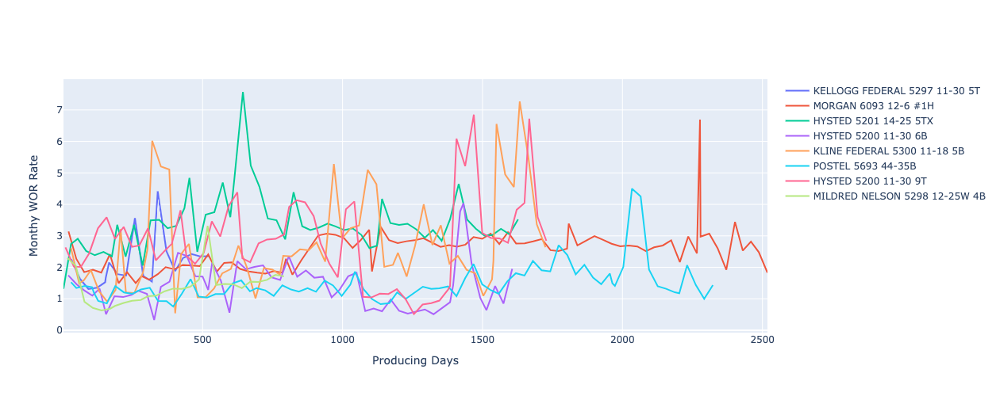

In [82]:
df9 = df_header[df_header['Current_Operator'].str.contains('OASIS')].sample(8)


df_prod = df_production.copy()
# ---------------------------------------------------------
STREAM_PLOT(dataframe = df9, 
            production_dataframe = df_prod[df_prod['WOR'].between(0.05, 8)], 
            material = 'WOR', 
            cumulative = 0, 
            line_width = 2,
            width = 800, height = 500)

## Water / Oil Ratio Plot

2008-2012 291 wells
2012-2014 441 wells
2014-2016 299 wells
2016-2018 207 wells
2018-2020 194 wells


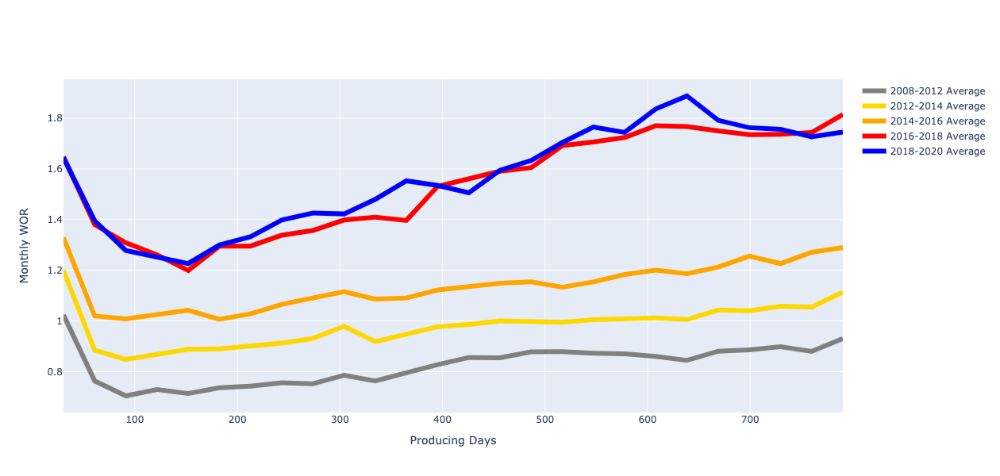

In [69]:
df9 = df_header[df_header['Vintage_Year'] > 2008].sample(1000)
df_prod = df_production[df_production['WOR'].between(0,10)]
# ---------------------------------------------------------
STREAM_PLOT(dataframe = df9, 
            production_dataframe = df_prod, 
            material = 'WOR', 
            cumulative = 0, 
            variable = 'Vintage_Year', 
            variable_dict = {'2008-2012':'grey','2012-2014':'gold','2014-2016':'orange','2016-2018':'red','2018-2020':'blue'},
            averages = 1,
            all_streams = 0,
            width = 800, height = 600 )

## Production by ~Depth / Pressure

0-9000 78 wells
9000-10000 240 wells
10000-11000 877 wells
11000-12000 1280 wells
12000-13000 30 wells


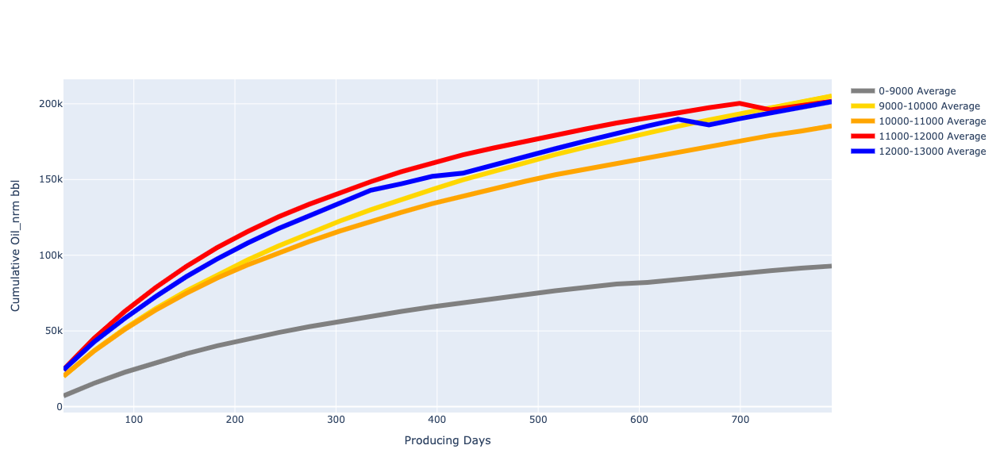

In [46]:
df9 = df_header.sample(2500)
df_prod = df_production.copy()
# ---------------------------------------------------------
STREAM_PLOT(dataframe = df9, 
            production_dataframe = df_prod, 
            material = 'Oil_nrm', 
            cumulative =1, 
            variable = 'Top_Perf', 
            variable_dict = {'0-9000':'grey','9000-10000':'gold','10000-11000':'orange','11000-12000':'red','12000-13000':'blue'},
            averages = 1,
            all_streams = 0,
            width = 800, height = 600 )

## What are the most prolific blocks?

##### Group by Blocks

In [87]:
df_blocks = pd.DataFrame()
df_blocks['num_wells_block'] = df_header.groupby('Block')['Block'].count()

df_blocks['24m_oil_cum_block'] = df_header.groupby('Block')['24m_Oil_nrm_cum'].sum().astype(int)
df_blocks['24m_oil_mean_block'] = df_header.groupby('Block')['24m_Oil_nrm_cum'].mean().astype(int)
df_blocks['24m_WOR_mean_block'] = df_header.groupby('Block')['24m_WOR'].mean()

df_blocks.sort_values('24m_oil_mean_block',inplace=True, ascending=False)

df_blocks.head()

,num_wells_block,24m_oil_cum_block,24m_oil_mean_block,24m_WOR_mean_block
Block,,,,
15496,38,35512847,1145575,0.612
15490,98,45207218,486099,0.449
15390,79,38254643,484235,0.442
145101,6,2831324,471887,0.006
15291,124,35223372,341974,0.385


### Merge

In [88]:
df_header_blocks = df_header.merge(df_blocks, left_on = 'Block', right_index=True)
df_header_blocks.head()

,File_Number,Well_Name,Well_Type,Well_Status,Location,Latitude,Longitude,Current_Operator,Completion_Date,Total_Depth,Spud_Date,Perf_Interval,Cum_Oil,Cum_Gas,Cum_Water,Vintage_Year,Top_Perf,Bottom_Perf,Operator,Perforated_Length,Direction,TRS,Section,Township,Range,Block,12m_Oil_nrm_cum,12m_WOR,24m_Oil_nrm_cum,24m_WOR,36m_Oil_nrm_cum,36m_WOR,num_wells_block,24m_oil_cum_block,24m_oil_mean_block,24m_WOR_mean_block
UWI,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
33053022510000,12531,CINNAMON CREEK 31-7H,OG,A,NWNE 7-145-102,47.400,-103.723,"PETRO-HUNT DAKOTA, LLC",1988-12-22,13407,1988-10-28,10899-13407,102135,82977,5581,1988.000,10899.000,13407.000,PETRO-HUNT,2508.000,NWNE,7-145-102,7,145,102,145102,74971.000,0.001,120764.000,0.003,157022.000,0.008,10,2542429,254242,0.197
33053023270000,12884,MOI BUCKHORN 41-35H,OG,A,NENE 35-145-102,47.340,-103.632,"NP RESOURCES, LLC",1990-05-29,13305,1990-04-07,10932-13305,307337,436364,8562,1990.000,10932.000,13305.000,NP,2373.000,NENE,35-145-102,35,145,102,145102,278293.000,0.001,470642.000,0.001,618678.000,0.009,10,2542429,254242,0.197
33053023600000,13150,ROUGH RIDER 44-23H,OG,IA,SESE 23-145-102,47.360,-103.633,"NP RESOURCES, LLC",1992-05-07,13312,1992-03-28,10625-13312,163482,124200,4864,1992.000,10625.000,13312.000,NP,2687.000,SESE,23-145-102,23,145,102,145102,76157.000,0.000,123482.000,0.037,158229.000,0.000,10,2542429,254242,0.197
33053023750000,13301,ROUGH RIDER TROTTER 31-26H,OG,A,NWNE 26-145-102,47.356,-103.635,"WHITE ROCK OIL & GAS, LLC",1992-02-15,13346,1992-01-06,10572-13346,306337,593611,5592,1992.000,10572.000,13346.000,WHITE,2774.000,NWNE,26-145-102,26,145,102,145102,319039.000,0.004,505260.000,0.001,623733.000,0.019,10,2542429,254242,0.197
33053023790000,13334,PIERRE CREEK FEDERAL 31-1H,OG,A,NWNE 1-145-102,47.415,-103.616,"WHITE ROCK OIL & GAS, LLC",1992-04-22,13655,1992-03-13,10774-13549,220868,945205,6511,1992.000,10774.000,13549.000,WHITE,2775.000,NWNE,1-145-102,1,145,102,145102,334537.000,0.003,478324.000,0.012,544315.000,0.022,10,2542429,254242,0.197


# Map

In [90]:
df_map = df_header_blocks.copy()

# Create map
map_visual = folium.Map(location=(df_map['Latitude'].mean(), df_map['Longitude'].mean()), zoom_start = 8, width = 500, height = 500)

# Specify feature to color by
color_by = '24m_oil_mean_block'

# Create color map
colormap = cm.LinearColormap(colors=['black','gray','green','yellow','orange','red','magenta'], vmin=60000, vmax= 400000)

# Loop through each well in DataFrame, create circle, add to map.
for uwi in df_map.index:
    folium.Circle(
        location=[df_map.loc[uwi]['Latitude'], df_map.loc[uwi]['Longitude']],
        radius = 1250,
        fill = True,
        fill_opacity = 1,
        color = colormap(df_map.loc[uwi][color_by])
    ).add_to(map_visual)
    
# Add colorbar
colormap.caption = 'Top_Perf'
map_visual.add_child(colormap)

# View
map_visual